# Scalable Systems Programming Project

Author: Komal Riddhish Bharadva <br>
Student ID: 19213051

# Table of Contents

* [1. Importing Libraries, Loading Data and Pre-processing](#Importing)
* [2. Exploratory Data Analysis (Basic Visualizations)](#Exploratory)     
* [3. Choosing correct clustering algorithm](#Choosing)
* [4. Choosing optimal number of clusters](#Choosing1)
    * [4.1 Using Elbow Method:](#Elbow)
    * [4.2 Using Davies-Bouldin Index:](#Davies)
    * [4.2 Using Silhouette Method:](#Silhouette)
* [5. K-means clustering using Sklearn (Visualizations)](#Sklearn)
* [6. K-means clustering using MapReduce](#MR) 
    * [6.1 Loading the final centroids from MapReduce and plotting:](#Loading)
    * [6.1 Loading labels from MapReduce and visualizing:](#Loading1)
* [7. Evaluation](#Evaluation)
* [8. K-means clustering using MapReduce(Visualizations)](#MRVis)   

## 1. Importing Libraries, Loading Data and Pre-processing <a class="anchor" id="Importing"></a>

[TOC](#Table-of-Contents)

In [1]:
# Importing all the necessay libraries
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import pandas_profiling
import plotly as py
import plotly.graph_objs as go
import seaborn as sns
import calendar
from plotnine import *
from sklearn.metrics import silhouette_samples, silhouette_score, davies_bouldin_score, jaccard_score
import matplotlib.cm as cm
from sklearn.preprocessing import scale
from itertools import cycle, islice
from pandas.plotting import parallel_coordinates
from numpy import unique, where
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import AgglomerativeClustering, Birch, DBSCAN, KMeans
from sklearn.mixture import GaussianMixture 
from sklearn_extra.cluster import KMedoids
# conda install -c conda-forge scikit-learn-extra

In [2]:
# Loading the dataset
df = pd.read_csv('household_power_consumption.txt', parse_dates={'DateTime' : ['Date', 'Time']}, infer_datetime_format=True, 
                 low_memory=False, na_values=['nan','?'], sep=';')
# To look at first 5 rows
df.head()

,DateTime,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0
1,2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0
2,2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0
3,2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0
4,2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0


In [3]:
# To check null values present
df.isnull().sum()

DateTime                     0
Global_active_power      25979
Global_reactive_power    25979
Voltage                  25979
Global_intensity         25979
Sub_metering_1           25979
Sub_metering_2           25979
Sub_metering_3           25979
dtype: int64

In [4]:
# To check the number of rows and columns in dataset
df.shape

(2075259, 8)

In [5]:
# Shows all the basic statistics of the dataset
df.profile_report()

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# Dropping the null values
df.dropna(inplace = True)

In [7]:
# Checking the shape of dataframe after dropping null values
df.shape

(2049280, 8)

## 2. Exploratory Data Analysis (Basic Visualizations) <a class="anchor" id="Exploratory"></a>

[TOC](#Table-of-Contents)

In [8]:
# Making a copy of the original dataframe
df_copy = df.copy()
# Setting datetime column as index
df_copy = df_copy.set_index('DateTime')
# Resample data with respect to day and summing it
df_resampled = df_copy.resample('D').sum()
# Data after sampling into daywise
df_resampled.head()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
DateTime,,,,,,,
2006-12-16,1209.176,34.922,93552.53,5180.8,0.0,546.0,4926.0
2006-12-17,3390.460,226.006,345725.32,14398.6,2033.0,4187.0,13341.0
2006-12-18,2203.826,161.792,347373.64,9247.2,1063.0,2621.0,14018.0
2006-12-19,1666.194,150.942,348479.01,7094.0,839.0,7602.0,6197.0
2006-12-20,2225.748,160.998,348923.61,9313.0,0.0,2648.0,14063.0


#### Basic Visualization 1:  <a class="anchor" id="Basic_2_1"></a>

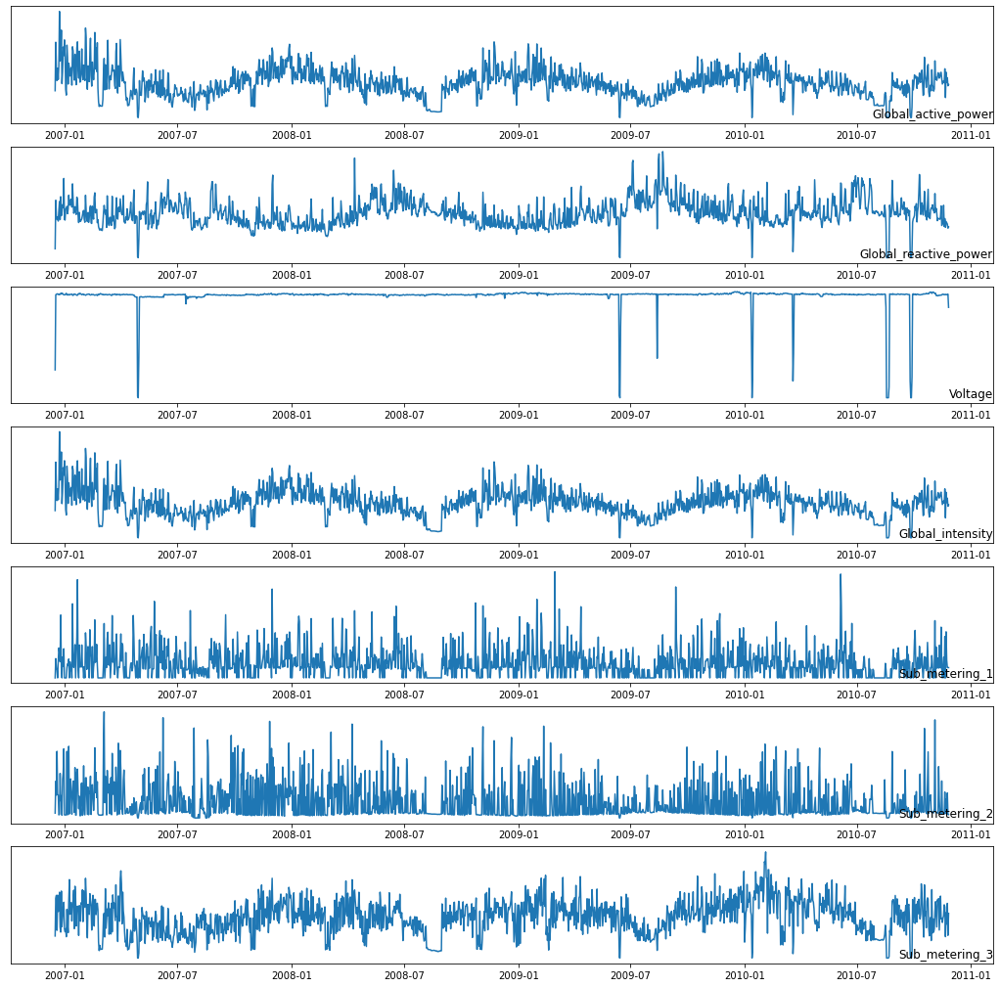

In [9]:
# Checking the distribution of all the columns with respect to date
# Creating subplots and defining figure size
fig, ax = plt.subplots(figsize = (18,18))
# Using for loop to plot distribution for all the columns present in dataset
for i in range(len(df_resampled.columns)):
    plt.subplot(len(df_resampled.columns), 1, i+1)
    name = df_resampled.columns[i]
    plt.plot(df_resampled[name])
    # Giving title to each plot
    plt.title(name, y = 0, loc = 'right')
    # Omiting Y-labels
    plt.yticks([])
# To show the plot
plt.show()

💡 Insight: <br>
We can observe some spike during the weekends across the whole year.

#### Basic Visualization 2: <a class="anchor" id="Basic_2_2"></a>

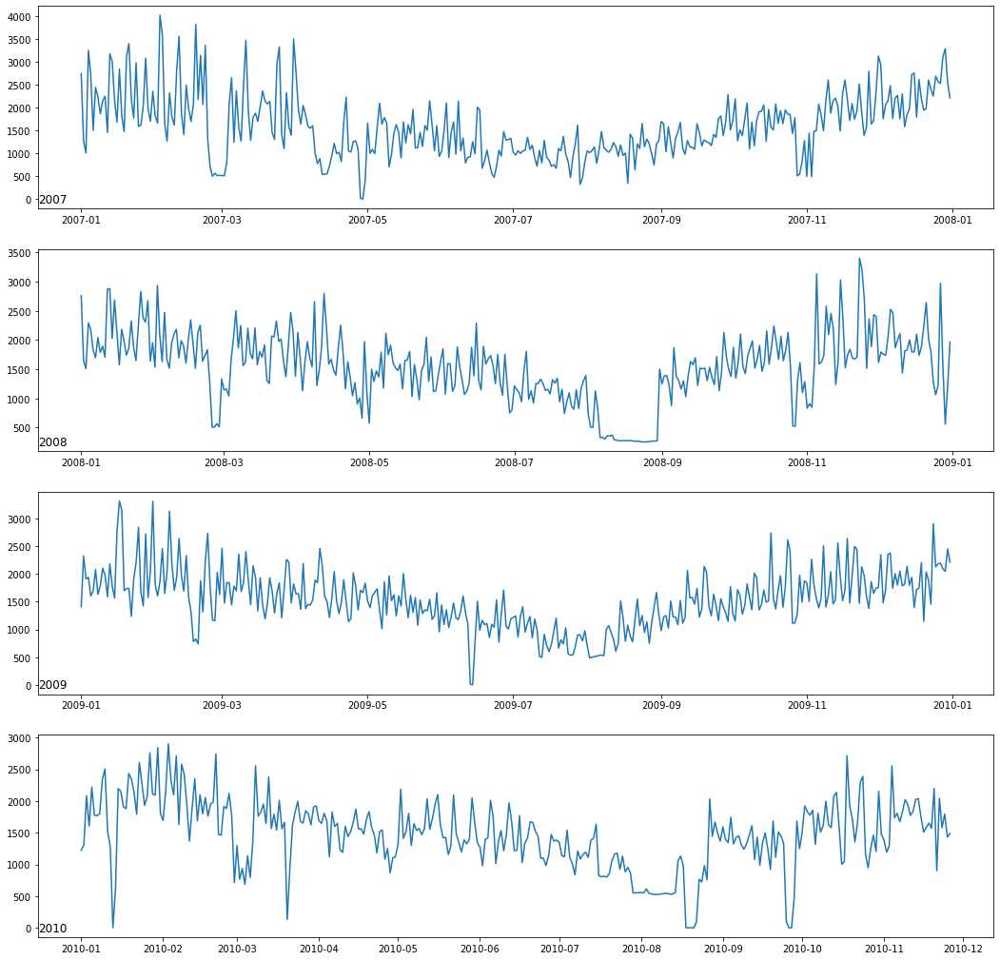

In [10]:
# Plotting active power consumption for each year
years = ['2007', '2008', '2009', '2010']
# Creating subplots and defining figure size
fig, ax = plt.subplots(figsize = (18, 18))
# Using for loop to plot active power for each year
for i in range(len(years)):
    plt.subplot(len(years), 1, i + 1)
    year = years[i]
    ap_data = df_resampled[str(year)]
    plt.plot(ap_data['Global_active_power'])
    # Giving a title to each plot
    plt.title(str(year), y = 0, loc = 'left')
# To display the plot    
plt.show()

💡 Insight: <br>
A similar pattern is observed across the years, like across February-March and across August-September, a reduction in the utilization of electricity is noticed.

#### Basic Visualization 3: <a class="anchor" id="Basic_2_3"></a>

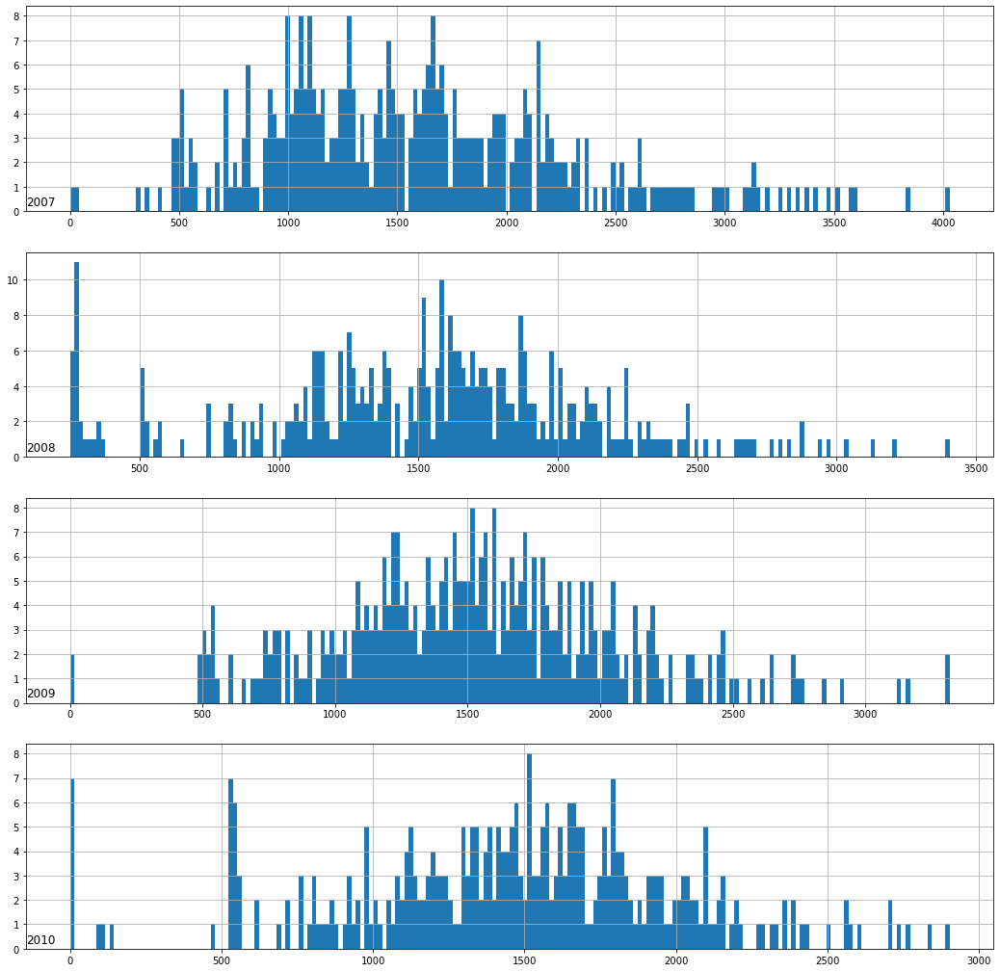

In [11]:
# Plotting year-wise global_active_power with histogram
# Creating subplots and defining figure size
fig, ax = plt.subplots(figsize = (18, 18))
for i in range(len(years)):
    plt.subplot(len(years), 1, i + 1)
    year = years[i]
    active_power_data = df_resampled[str(year)]
    active_power_data['Global_active_power'].hist(bins = 200)
    # Giving a title to each plot
    plt.title(str(year), y = 0, loc = 'left')
# To display the plot      
plt.show()

#### Basic Visualization 4: <a class="anchor" id="Basic_2_4"></a>

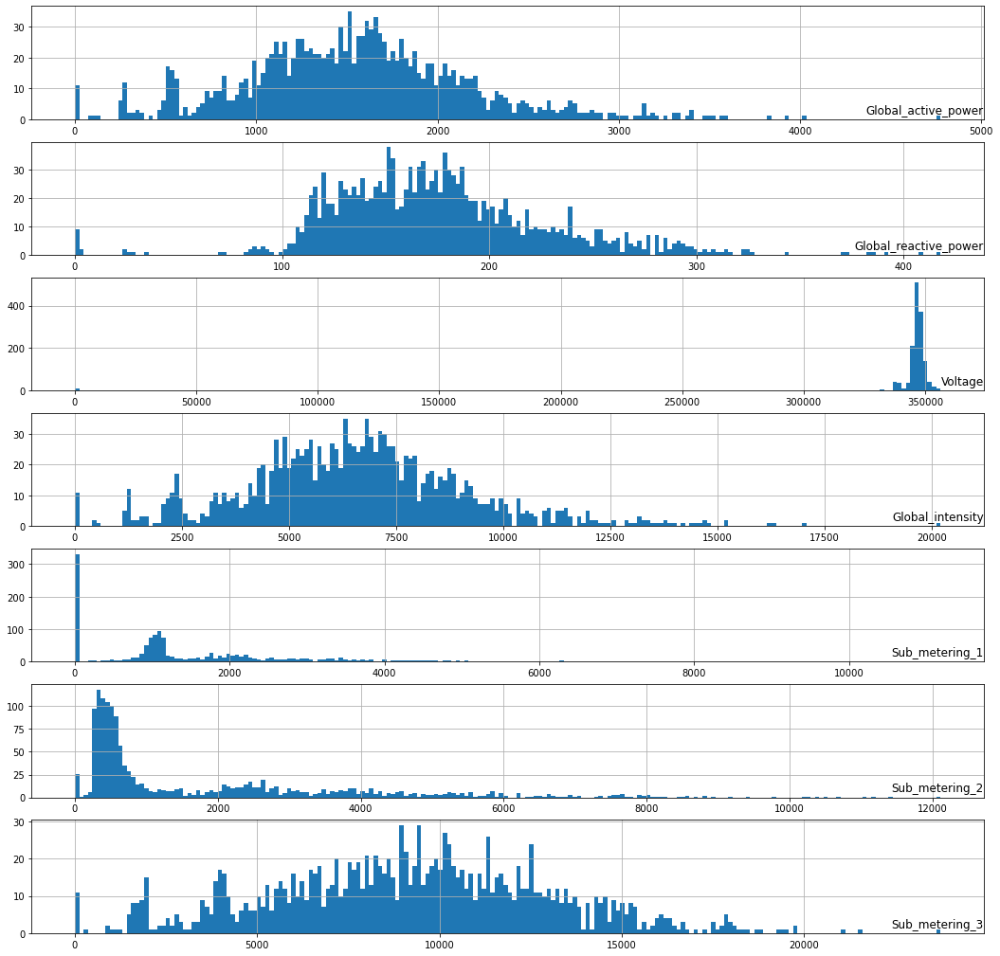

In [12]:
# Histogram plot for all attributes
# Creating subplots and defining figure size
fig, ax = plt.subplots(figsize = (18, 18))
for i in range(len(df_resampled.columns)):
    plt.subplot(len(df_resampled.columns), 1, i + 1)
    name = df_resampled.columns[i]
    # Bining the data into 200 bins
    df_resampled[name].hist(bins = 200)
    # Giving a title to each plot
    plt.title(name, y = 0, loc = 'right')
#     plt.yticks([])
# To display the plot 
plt.show()

#### Basic Visualization 5: <a class="anchor" id="Basic_2_5"></a>

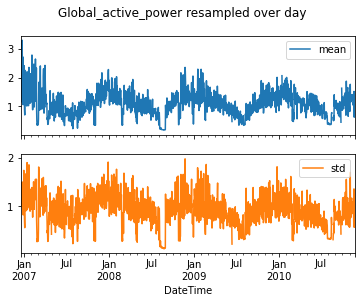

In [13]:
# Resampling over day with mean and standard deviation for 'Global_active_power' column
df_copy['Global_active_power'].resample('D').agg(['mean', 'std']).plot(subplots = True, 
                                                                       title = 'Global_active_power resampled over day')
# To display the plot
plt.show()

💡 Insight: <br>
We can observe that the mean and the standard deviation of resampled data set, have similar structure.

#### Basic Visualization 6: <a class="anchor" id="Basic_2_6"></a>

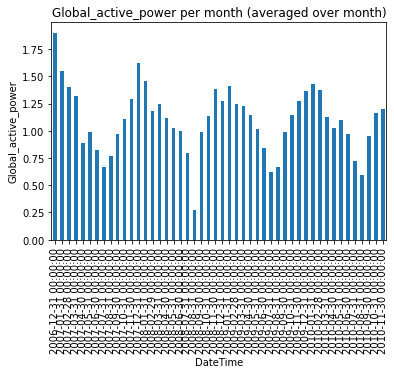

In [14]:
# Resampling 'Global_active_power' over month and taking mean
df_copy['Global_active_power'].resample('M').mean().plot(kind = 'bar')
# Labelling the y-axis
plt.ylabel('Global_active_power')
# To give a title to the plot
plt.title('Global_active_power per month (averaged over month)')
# To display the plot
plt.show()

#### Basic Visualization 7: <a class="anchor" id="Basic_2_7"></a>

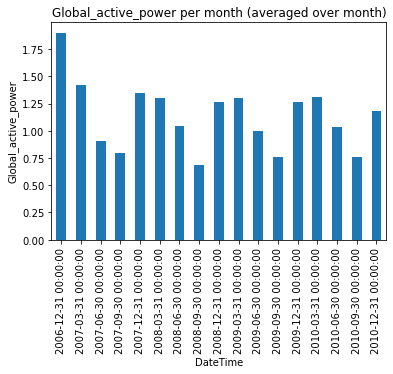

In [15]:
# Resampling 'Global_active_power' over quarter and taking mean
df_copy['Global_active_power'].resample('Q').mean().plot(kind = 'bar')
# Labelling the y-axis
plt.ylabel('Global_active_power')
# To give a title to the plot
plt.title('Global_active_power per month (averaged over month)')
# To display the plot
plt.show()

#### Basic Visualization 8: <a class="anchor" id="Basic_2_8"></a>

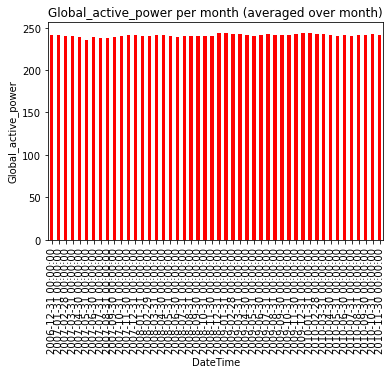

In [16]:
# Resampling 'Voltage' over month and taking mean
df_copy['Voltage'].resample('M').mean().plot(kind = 'bar', color = 'red')
# Labelling the y-axis
plt.ylabel('Global_active_power')
# To give a title to the plot
plt.title('Global_active_power per month (averaged over month)')
# To display the plot
plt.show()

💡 Insight: <br>
We have compared the mean of different features resampled over day. We can observe that the mean of 'Voltage' over month is pretty much constant as compared to other features.

#### Basic Visualization 9: <a class="anchor" id="Entities"></a>

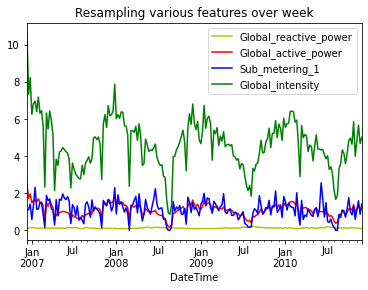

In [17]:
# Resampling over week and computing mean for 'Global_reactive_power'
df_copy.Global_reactive_power.resample('W').mean().plot(color = 'y', legend = True)
# Resampling over week and computing mean for 'Global_active_power'
df_copy.Global_active_power.resample('W').mean().plot(color = 'r', legend = True)
# Resampling over week and computing mean for 'Sub_metering_1'
df_copy.Sub_metering_1.resample('W').mean().plot(color = 'b', legend = True)
# Resampling over week and computing mean for 'Global_intensity'
df_copy.Global_intensity.resample('W').mean().plot(color = 'g', legend = True)
# Setting the title for the plot
plt.title("Resampling various features over week")
# To display the plot
plt.show()

## 3. Choosing correct clustering algorithm <a class="anchor" id="Choosing"></a>

[TOC](#Table-of-Contents)

In [18]:
# Selecting only 2 columns so taht we will be able to plot 2D plot
df_subset = df[['Global_active_power','Global_reactive_power']]
# Taking a random sample of data
df_subset = df_subset.sample(10000)
# Scaling the data before applying clustering algortihms
X = scale(df_subset)

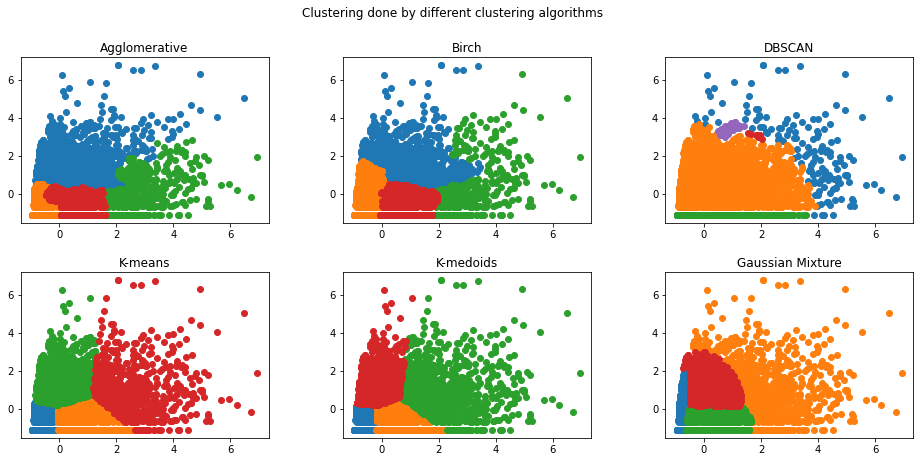

In [19]:
# Creating multiple plots in one figure
fig, ax = plt.subplots(2, 3, figsize = (16,7))
# Adjusting space between plots
fig.subplots_adjust(hspace = 0.3, wspace = 0.3)

# Agglomerative clustering
# define the model
model = AgglomerativeClustering(n_clusters = 4)
# fit model and predict clusters
y_pred = model.fit_predict(X)
# retrieve unique clusters
clusters = unique(y_pred)
# create scatter plot for samples from each cluster
for cluster in clusters:
    # get row indexes for samples with this cluster
    row_ix = where(y_pred == cluster)
    # create scatter of these samples
    ax[0,0].scatter(X[row_ix, 0], X[row_ix, 1])
    # set the title for this plot
    ax[0,0].set_title("Agglomerative")


# Birch clustering
# define the model
model = Birch(threshold = 0.01, n_clusters = 4)
# fit the model
model.fit(X)
# assign a cluster to each example
y_pred = model.predict(X)
# retrieve unique clusters
clusters = unique(y_pred)
# create scatter plot for samples from each cluster
for cluster in clusters:
    # get row indexes for samples with this cluster
    row_ix = where(y_pred == cluster)
    # create scatter of these samples
    ax[0,1].scatter(X[row_ix, 0], X[row_ix, 1])
    # set the title for this plot
    ax[0,1].set_title("Birch")

# DBSCAN clustering
# define the model
model = DBSCAN(eps = 0.30, min_samples = 9)
# fit model and predict clusters
y_pred = model.fit_predict(X)
# retrieve unique clusters
clusters = unique(y_pred)
# create scatter plot for samples from each cluster
for cluster in clusters:
    # get row indexes for samples with this cluster
    row_ix = where(y_pred == cluster)
    # create scatter of these samples
    ax[0,2].scatter(X[row_ix, 0], X[row_ix, 1])
    # set the title for this plot
    ax[0,2].set_title("DBSCAN")


# K-means clustering
# define the model
model = KMeans(n_clusters = 4)
# fit the model
model.fit(X)
# assign a cluster to each example
y_pred = model.predict(X)
# retrieve unique clusters
clusters = unique(y_pred)
# create scatter plot for samples from each cluster
for cluster in clusters:
    # get row indexes for samples with this cluster
    row_ix = where(y_pred == cluster)
    # create scatter of these samples
    ax[1,0].scatter(X[row_ix, 0], X[row_ix, 1])
    # set the title for this plot
    ax[1,0].set_title("K-means")

# K-medoids clustering
# define the model
model = KMedoids(n_clusters = 4)
# fit the model
model.fit(X)
# assign a cluster to each example
y_pred = model.predict(X)
# retrieve unique clusters
clusters = unique(y_pred)
# create scatter plot for samples from each cluster
for cluster in clusters:
    # get row indexes for samples with this cluster
    row_ix = where(y_pred == cluster)
    # create scatter of these samples
    ax[1,1].scatter(X[row_ix, 0], X[row_ix, 1])
    # set the title for this plot
    ax[1,1].set_title("K-medoids")

# Gaussian Mixture clustering
# define the model
model = GaussianMixture(n_components = 4)
# fit the model
model.fit(X)
# assign a cluster to each example
y_pred = model.predict(X)
# retrieve unique clusters
clusters = unique(y_pred)
# create scatter plot for samples from each cluster
for cluster in clusters:
    # get row indexes for samples with this cluster
    row_ix = where(y_pred == cluster)
    # create scatter of these samples
    ax[1,2].scatter(X[row_ix, 0], X[row_ix, 1])
    # set the title for this plot
    ax[1,2].set_title("Gaussian Mixture")

# Title for whole plot    
plt.suptitle("Clustering done by different clustering algorithms")
# show the plots
plt.show()

💡 Insight: <br>
We can infer that the K-means clustering algorithms seems to be performing well as compared to the other clustering algorithms. So we choose K-means clustering for the analysis.

## 4. Choosing optimal number of clusters <a class="anchor" id="Choosing1"></a>

[TOC](#Table-of-Contents)

In [20]:
# Selecting all the columns except for datetime column
df1 = df.loc[:, 'Global_active_power':'Sub_metering_3']
# Scaling whole data and converting it into dataframe
X = scale(df1)
df1 = pd.DataFrame(X)
# Taking a random sample of scaled data
df2 = df1.sample(10000)

### 4.1 Using Elbow Method: <a class="anchor" id="Elbow"></a>

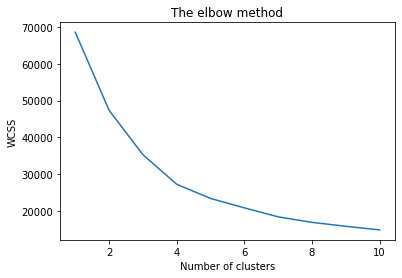

In [21]:
# Using the elbow method to check the optimal number of clusters for this dataset
# Initializing the list to store all values of wcss
wcss = []
for i in range(1,11):
    # Applying sklearn k-means algorithms
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10)
    # Fitting the sample data
    kmeans.fit(df2)
    # Appending the obtained inertia to the defined list
    wcss.append(kmeans.inertia_)
    
# Plotting the kmeans inertia to derive the optimal number of clusters    
plt.plot(range(1,11), wcss)
# Set the title for the plot
plt.title('The elbow method')
# Labelling x-axis for the plot
plt.xlabel('Number of clusters')
# Labelling y-axis for the plot
plt.ylabel('WCSS')
# To display the plot
plt.show()    

💡 Insight: <br>
From the above elbow plot, we can infer that the optimal number of clusters can be 4. 

### 4.2 Using Davies-Bouldin Index: <a class="anchor" id="Davies"></a>

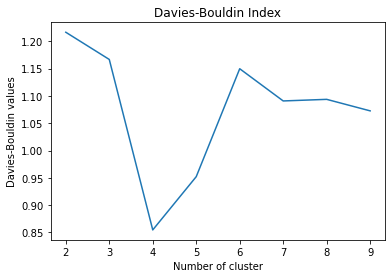

In [22]:
# Creating a dictionary to store keys and values
db = {}
for k in range(2, 10):
    # Initialize Kmeans and fit
    kmeans = KMeans(n_clusters = k, max_iter = 1000, random_state = 10).fit(df2)
    # Storing the cluster labels
    clusters = kmeans.labels_
    # Calculating Davies Bouldin Score
    db[k] = davies_bouldin_score(df2, clusters)

# Plotting the Davies Bouldin Score obtained
plt.plot(list(db.keys()), list(db.values()))
# Labelling x-axis for the plot
plt.xlabel("Number of cluster")
# Labelling y-axis for the plot
plt.ylabel("Davies-Bouldin values")
# Setting a title for the plot
plt.title("Davies-Bouldin Index")
# To display the plot
plt.show()

💡 Insight: <br>
It is clear from the Davies Bouldin score that the best number of clusters should be 4. 

### 4.3 Using Silhouette Method: <a class="anchor" id="Silhouette"></a>

For cluster = 2 The average silhouette_score is : 0.402
For cluster = 3 The average silhouette_score is : 0.42
For cluster = 4 The average silhouette_score is : 0.438
For cluster = 5 The average silhouette_score is : 0.343
For cluster = 6 The average silhouette_score is : 0.335
For cluster = 7 The average silhouette_score is : 0.32
For cluster = 8 The average silhouette_score is : 0.314


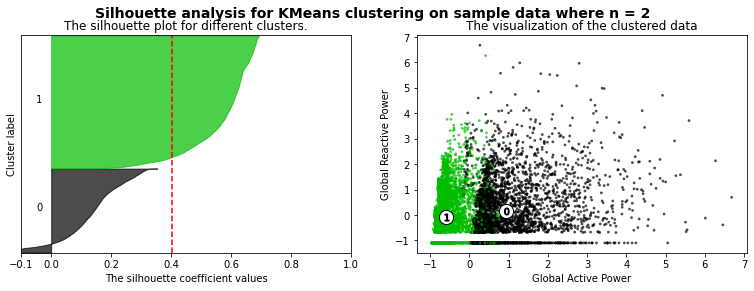

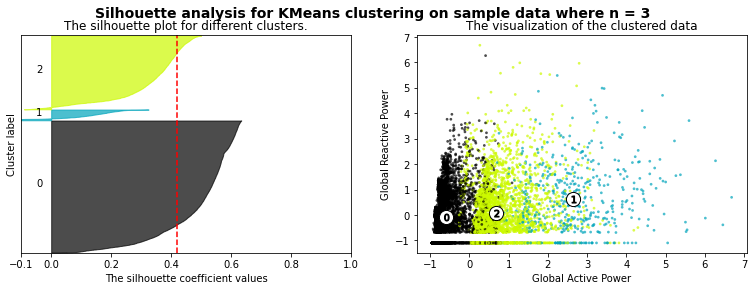

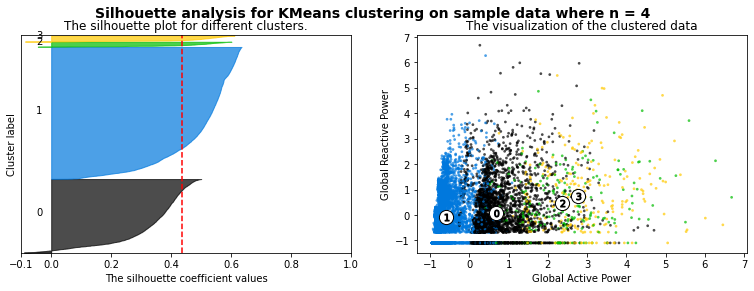

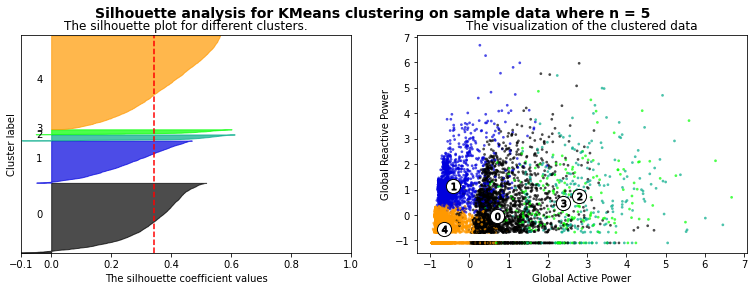

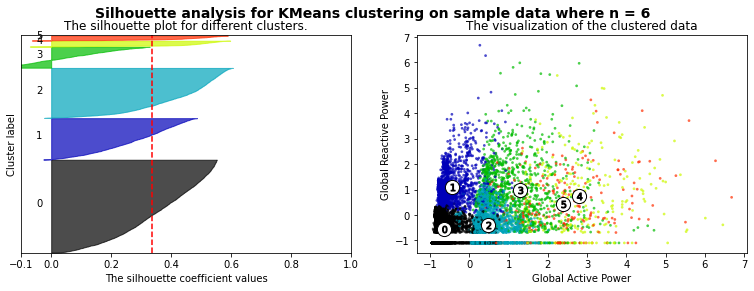

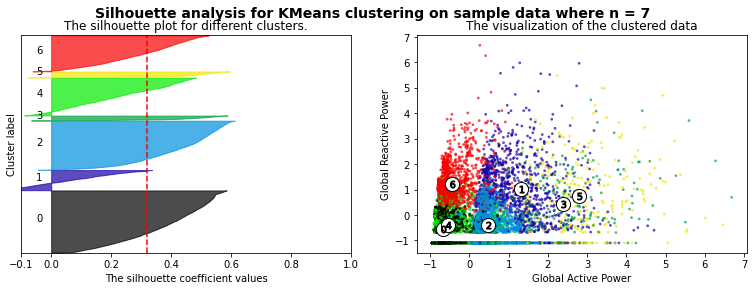

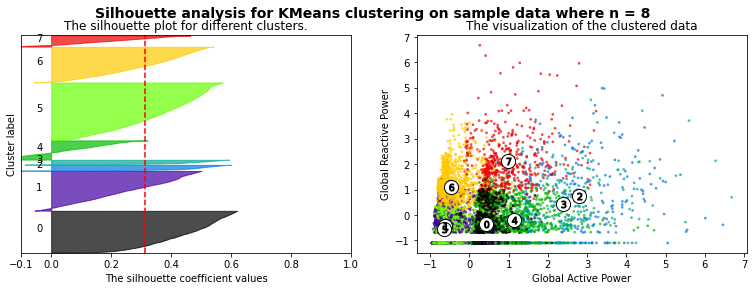

In [23]:
# Using the silhouette method for determining optimal number of clusters
for n_clusters in range(2,9):
    # Creating a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    # Setting the figure size
    fig.set_size_inches(13, 4)
    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette plots
    ax1.set_ylim([0, len(df2) + (n_clusters + 1) * 10])

    # Using K-means to generate the clusters
    clusterer = KMeans(n_clusters = n_clusters, random_state = 10)
    # Storing the cluster labels
    cluster_labels = clusterer.fit_predict(df2)
    
    # The silhouette_score gives the average value for all the data points
    sil_avg = silhouette_score(df2, cluster_labels)
    # Printing Average silhouette score for each cluster
    print("For cluster =", n_clusters, "The average silhouette_score is :", sil_avg.round(3))
    # Compute the silhouette scores for each cluster
    sample_sil_values = silhouette_samples(df2, cluster_labels)
    y_lower = 10 
    for i in range(n_clusters):
        # Aggregate and sorting the silhouette scores for samples belonging to cluster i
        ith_cluster_sil_values = sample_sil_values[cluster_labels == i]
        ith_cluster_sil_values.sort()
        size_cluster_i = ith_cluster_sil_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_sil_values,
                          facecolor = color, edgecolor = color, alpha = 0.7)
        # Labelling the silhouette plots with their cluster numbers
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  
    # Setting the title for each plot
    ax1.set_title("The silhouette plot for different clusters.")
    # Labelling x-axis for the plot
    ax1.set_xlabel("The silhouette coefficient values")
    # Labelling y-axis for the plot
    ax1.set_ylabel("Cluster label")
    # The vertical line for average silhouette score of all the values
    ax1.axvline(x = sil_avg, color = "red", linestyle = "--")
    ax1.set_yticks([])  # Clear the yaxis labels 
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1]) # Setting xaxis labels or ticks

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    # Plotting a scatter plot for 'Global Active Power' and 'Global Reactive Power' columns
    ax2.scatter(df2.iloc[:, 0], df2.iloc[:, 1], marker='.', s = 30, lw = 0, alpha = 0.7, c = colors, edgecolor = 'k')
    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker = 'o', c = "white", alpha = 1, s = 200, edgecolor = 'k')
    for i, c in enumerate(centers):
        # Plotting a scatter plot for marking the centers of clusters
        ax2.scatter(c[0], c[1], marker = '$%d$' % i, alpha = 1, s = 50, edgecolor = 'k')
    # Setting the title for each plot
    ax2.set_title("The visualization of the clustered data")
    # Labelling x-axis for the plot
    ax2.set_xlabel("Global Active Power")
    # Labelling y-axis for the plot
    ax2.set_ylabel("Global Reactive Power")
    # Setting a global title for each pair of plot
    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data " "where n = %d" % n_clusters),
                 fontsize = 14, fontweight = 'bold')
# To display the plot
plt.show()

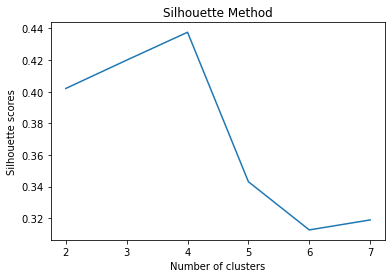

2:0.40206284316601676
3:0.419960511133702
4:0.43760020164750285
5:0.343104735048295
6:0.3126412785819356
7:0.31895293005918157


In [24]:
# Plotting silhouette graph to visualize it more clearly
# Initializing an empty list to store silhouette_score
sil = []
for k in range(2, 8):
    # Using K-means clustering algorithm and fitting on sample data
    kmeans = KMeans(n_clusters = k) 
    # Fitting and predicting clusters for sample data
    preds = kmeans.fit_predict(df2)
    # Calculating and appending silhouette_scores to the list
    sil.append(silhouette_score(df2, preds, metric = 'euclidean'))

# Plotting the silhouette_scores
plt.plot(range(2, 8), sil)
# Setting the title for the plot
plt.title('Silhouette Method')
# Labelling x-axis for the plot
plt.xlabel('Number of clusters')
# Labelling y-axis for the plot
plt.ylabel('Silhouette scores')
# To display the plot
plt.show()

# To print silhouette_scores for each cluster
for i in range(len(sil)):
 print(str(i+2) +":"+ str(sil[i]))

💡 Insight: <br>
As observed from above elbow as well as silhouette score plots, it is now quite clear that the optimal number of clusters should be 4. 

### 5. K-means clustering using Sklearn (Visualizations) <a class="anchor" id="Sklearn"></a>

[TOC](#Table-of-Contents)

In [25]:
# As determined, now we will apply K-means algorithm with 4 clusters to whole dataset and perform some visualizations.
# Using K-means clustering algorithm
kmeans = KMeans(n_clusters = 4, random_state = 0)
# Fitting and predicting clusters for whole dataset
y_kmeans = kmeans.fit_predict(df1)

In [26]:
# Giving column names to the scaled dataset
df1.columns = ["Global_active_power","Global_reactive_power","Voltage","Global_intensity","Sub_metering_1",
            "Sub_metering_2","Sub_metering_3"]
# Taking a copy of column names
list_columns = df1.columns
# Adding the predicted values of cluster label from K-means to the final dataframe
df1['KM_cluster'] = y_kmeans

#### Visualization 1 (sklearn k-means): <a class="anchor" id="sklearnVis1"></a>

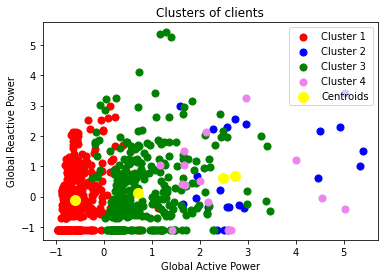

In [27]:
# Taking a sample of final dataframe for visualization
df_temp = df1.sample(1000)
# Converting the sample dataframe to an array
X = np.array(df_temp)
# Plotting a scatter plot for 'Global_active_power' and 'Global_reactive_power'
plt.scatter(X[df_temp['KM_cluster'] == 0, 0], X[df_temp['KM_cluster'] == 0, 1], s = 50, c = 'red', label = 'Cluster 1')
plt.scatter(X[df_temp['KM_cluster'] == 1, 0], X[df_temp['KM_cluster'] == 1, 1], s = 50, c = 'blue', label = 'Cluster 2')
plt.scatter(X[df_temp['KM_cluster'] == 2, 0], X[df_temp['KM_cluster'] == 2, 1], s = 50, c = 'green', label = 'Cluster 3')
plt.scatter(X[df_temp['KM_cluster'] == 3, 0], X[df_temp['KM_cluster'] == 3, 1], s = 50, c = 'violet', label = 'Cluster 4')
# Adding centroids to the scatter plot
plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:,1], s = 100, c = 'yellow', label = 'Centroids')
# Setting a title for the plot
plt.title('Clusters of clients')
# Labelling x-axis of the plot
plt.xlabel('Global Active Power')
# Labelling y-axis of the plot
plt.ylabel('Global Reactive Power')
# Adding Legends to the plot
plt.legend()
# To display the plot
plt.show()

In [28]:
# To Print Summary Statistics
for col in list_columns:
  print(col)
  print(df1[(col)].groupby(df1['KM_cluster']).agg(['count','mean','min','max','sum']))
  print('\n')

Global_active_power
              count      mean       min       max            sum
KM_cluster                                                      
0           1250217 -0.610697 -0.960580  1.405839 -763503.477795
1             55873  2.741805  0.384363  8.578868  153192.869633
2            695422  0.707174 -0.514157  6.303247  491784.035214
3             47768  2.481297  0.250058  9.486846  118526.572948


Global_reactive_power
              count      mean       min        max            sum
KM_cluster                                                       
0           1250217 -0.112023 -1.097519   7.046414 -140053.673081
1             55873  0.684481 -1.097519  11.233708   38244.006488
2            695422  0.103777 -1.097519  10.204627   72168.511208
3             47768  0.620523 -1.097519   9.743315   29641.155385


Voltage
              count      mean       min       max            sum
KM_cluster                                                      
0           1250217  0.285703 

#### Visualization 2 (sklearn k-means): <a class="anchor" id="sklearnVis2"></a>

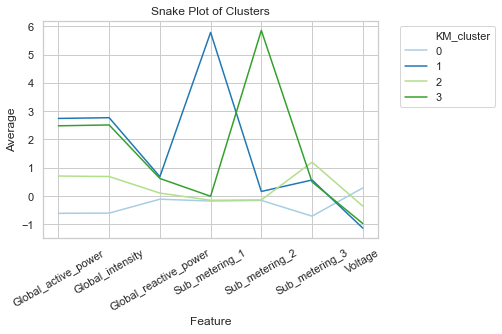

In [29]:
# Visualize snake plot with scaled values
# Grouping by K-means cluster labels and taking average
df_vis = df1[list_columns].groupby(df1['KM_cluster']).agg(['mean']).reset_index()
# Naming the columns for above created dataframe
df_vis.columns = ["KM_cluster", "Global_active_power", "Global_reactive_power", "Voltage", "Global_intensity", 
                  "Sub_metering_1", "Sub_metering_2", "Sub_metering_3"]
df_vis = pd.melt(df_vis, id_vars = 'KM_cluster',
                      value_vars = ["Global_active_power", "Global_reactive_power", "Voltage", "Global_intensity", 
                                    "Sub_metering_1", "Sub_metering_2", "Sub_metering_3"], var_name = 'Feature', 
                                     value_name = 'Average')
# Plotting the snake plot
# Setting the background style for the plot
sns.set(style = "whitegrid")
# Plotting a line plot and setting title for the plot
sns.lineplot('Feature', 'Average', hue = 'KM_cluster', data = df_vis, palette = 'Paired').set_title('Snake Plot of Clusters')
# Adding legends for the plot
plt.legend(bbox_to_anchor = (1.05, 1), loc = 2)
# Rotating the x-axis labels to 30 degrees
plt.xticks(rotation = 30)
# To display the plot
plt.show()

#### Visualization 3 (sklearn k-means): <a class="anchor" id="sklearnVis3"></a>

In [30]:
# Taking a sample of data
df3 = df1.sample(10000)
# Selecting only 2 attributes to plot in 2D plane
X1 = df3[['Global_active_power', 'Voltage']].iloc[: , :].values
# Applying k-means on sampled data
algorithm = (KMeans(n_clusters = 4, init='k-means++', n_init = 10, random_state = 111))
# Fitting the sampled data
algorithm.fit(X1)
# Getting the labels
labels1 = algorithm.labels_
# Getting the centroids
centroids1 = algorithm.cluster_centers_

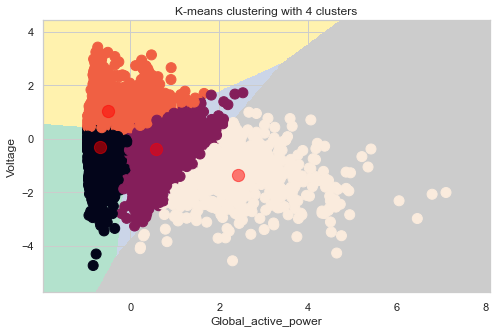

In [31]:
# Setting the plane for visualization
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = algorithm.predict(np.c_[xx.ravel(), yy.ravel()]) 
# Setting the figure size
plt.figure(1, figsize = (8, 5))
# To clear the entire plot
plt.clf()
# Reshaping the plot
Z = Z.reshape(xx.shape)
plt.imshow(Z , interpolation = 'nearest', extent = (xx.min(), xx.max(), yy.min(), yy.max()), cmap = plt.cm.Pastel2, 
           aspect = 'auto', origin = 'lower')
# Plotting the scatter plot for 'Global_active_power' and 'Voltage'
plt.scatter(x = 'Global_active_power', y = 'Voltage', data = df3, c = labels1, s = 100)
# Adding the centroids to the plot
plt.scatter(x = centroids1[: , 0], y =  centroids1[: , 1], s = 150, c = 'red', alpha = 0.5)
# Labelling x-axis of the plot
plt.xlabel('Global_active_power')
# Labelling y-axis of the plot
plt.ylabel('Voltage') 
# Setting a title for the plot
plt.title("K-means clustering with 4 clusters")
# To display the plot
plt.show()

## 6. K-means clustering using MapReduce <a class="anchor" id="MR"></a>

[TOC](#Table-of-Contents)

Execute run.sh and get the final centroids and labels from MapReduce

### 6.1 Loading the final centroids from MapReduce and plotting: <a class="anchor" id="Loading"></a>

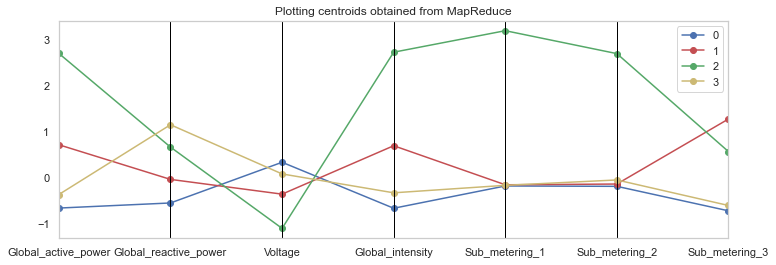

In [32]:
# Loading the final centroids from mapreduce
P = np.loadtxt('centroids1.txt', delimiter = ',')
# Converting in dataframe
P1 = pd.DataFrame(P)
# Giving column names
P1.columns = ["Global_active_power", "Global_reactive_power", "Voltage", "Global_intensity", "Sub_metering_1", "Sub_metering_2",
              "Sub_metering_3"]
# Giving the cluster number
P1['MR_cluster'] = P1.index
# Rounding the values in the dataframe
P1 = P1.round(3)

# Plotting centroids
# Creating list for colors to plot
my_colors = list(islice(cycle(['b', 'r', 'g','y']), None, len(P1)))
# Setting the figure size and y-axis limits
plt.figure(figsize = (12,4)).gca()
parallel_coordinates(P1, 'MR_cluster', color = my_colors, marker = 'o')
# Setting the title for the plot
plt.title("Plotting centroids obtained from MapReduce")
# To display the plot
plt.show()

### 6.2 Loading labels from MapReduce and visualizing: <a class="anchor" id="Loading1"></a>

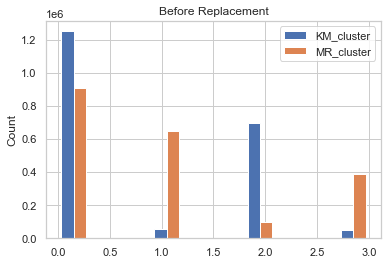

In [33]:
# Loading the labels from MapReduce
L = np.loadtxt('labels.txt')
# Converting it into list and as column in dataframe
df1['MR_cluster'] = L.tolist()
# Converting the type as integer
df1['MR_cluster'] = df1['MR_cluster'].astype('int32')
# Taking Datetime column from original dataframe
df1['DateTime'] = df['DateTime']

# Checking the distribution after changing the values
fig, ax1 = plt.subplots()
# Adding labels to the plot
labels = ['KM_cluster', 'MR_cluster']
# Plotting histogram for labels
ax1.hist([df1['KM_cluster'], df1['MR_cluster']], label = labels)
ax1.legend()
# Labelling the y-label for the plot
plt.ylabel("Count")
# Setting the title for the plot
plt.title("Before Replacement")
# To display the plot
plt.show()

We can see that there is a mismatch in the labels retreived from Mapreduce.

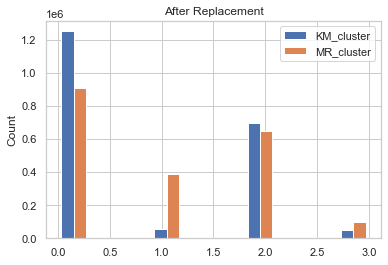

In [34]:
# Changing the values of labels according to the distribution
df1['MR_cluster'] = df1['MR_cluster'].replace([1], 4)
df1['MR_cluster'] = df1['MR_cluster'].replace([3], 1)
df1['MR_cluster'] = df1['MR_cluster'].replace([2], 3)
df1['MR_cluster'] = df1['MR_cluster'].replace([4], 2)


# Checking the distribution after changing the values
fig, ax1 = plt.subplots()
# Adding labels to the plot
labels = ['KM_cluster', 'MR_cluster']
# Plotting histogram for labels
ax1.hist([df1['KM_cluster'], df1['MR_cluster']], label = labels)
ax1.legend()
# Labelling the y-label for the plot
plt.ylabel("Count")
# Setting the title for the plot
plt.title("After Replacement")
# To display the plot
plt.show()

## 7. Evaluation <a class="anchor" id="Evaluation"></a>

[TOC](#Table-of-Contents)

In [35]:
# Dropping the null values
df1.dropna(inplace = True)
# Checking the accuracy of labels retrieved from MapReduce
acc = round(sum(df1['KM_cluster'] == df1['MR_cluster'])/df1['MR_cluster'].shape[0]*100, 3)
# Printing the accuracy
print("Accuracy is =", acc)
# df1.to_csv('Final_clusters.csv', index=False)

Accuracy is = 77.98


In [36]:
# Calculating Jaccard Score
jac = jaccard_score(df1['KM_cluster'], df1['MR_cluster'], average='weighted').round(3)
# Printing Jaccard Score
print("Jaccard score is =", jac)

Jaccard score is = 0.767


## 8. K-means clustering using MapReduce (Visualizations):  <a class="anchor" id="MRVis"></a>

[TOC](#Table-of-Contents)

#### MR Visualization 1:

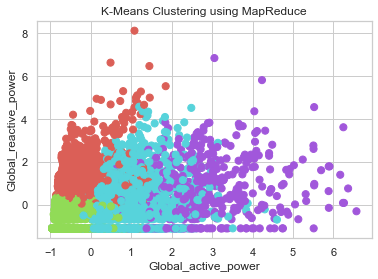

In [37]:
# Taking a sample of data for visualization
df3 = df1.sample(10000)

# Get Unique continents
color_labels = df3['MR_cluster'].unique()

# List of colors in the color palettes
rgb_values = sns.color_palette("hls", 4)

# Map continents to the colors
color_map = dict(zip(color_labels, rgb_values))

# Finally use the mapped values
# plt.scatter(df['population'], df['Area'], c=df['continent'].map(color_map))

# Plot the clusters obtained using MapReduce
plt.scatter(df3['Global_active_power'], df3['Global_reactive_power'], c = df3['MR_cluster'].map(color_map), s = 50)
# Setting the title for the plot
plt.title('K-Means Clustering using MapReduce')
# Labelling the x-axis of the plot
plt.xlabel('Global_active_power')
# Labelling the y-axis of the plot
plt.ylabel('Global_reactive_power')
# To display the plot
plt.show()

#### MR Visualizing 2:

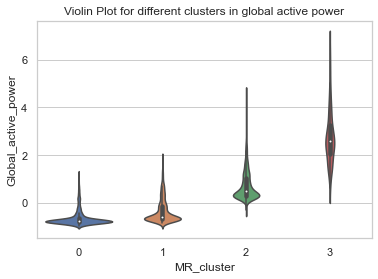

In [38]:
# Plotting Voilin plot for Global_active_power
sns.violinplot(x = "MR_cluster", y = "Global_active_power", data = df3)
# Setting the title for the plot
plt.title('Violin Plot for different clusters in global active power')
# To display the plot
plt.show()

#### MR Visualizing 3:

In [39]:
# Plotting 3D clustering graph for 3 features 'Global_reactive_power', 'Global_active_power' and 'Global_intensity' using plotly
trace1 = go.Scatter3d(x = df3['Global_reactive_power'], y = df3['Global_active_power'], z = df3['Global_intensity'], 
                      mode = 'markers', marker = dict(color = df3['MR_cluster'], size = 10, 
                                                      line = dict(color = 'black', width = 12), opacity = 0.8))
data = [trace1]
layout = go.Layout(margin = dict(l = 0, r = 0), height = 800, width = 800,
                   title = 'Clusters wrt Global_reactive_power, Global_active_power and Global_intensity',
                   scene = dict(xaxis = dict(title  = 'Global_reactive_power -->'),
                                yaxis = dict(title  = 'Global_active_power -->'), 
                                zaxis = dict(title  = 'Global_intensity -->')))
fig = go.Figure(data = data, layout = layout)
py.offline.iplot(fig)

#### MR Visualizing 4:

In [40]:
import plotly.express as px
fig = px.scatter_3d(df3, x = "Global_active_power", y = "Global_reactive_power", z = "Voltage", color = "MR_cluster", 
                    title = "Scatter plot for Global_active_power, Global_reactive_power and Voltage")
fig.show()

#### MR Visualizing 5:

In [41]:
import plotly.express as px
fig = px.scatter_ternary(df3, a = "Global_active_power", b = "Global_reactive_power", c = "Sub_metering_3", color = "MR_cluster", 
                    hover_name = "MR_cluster")
fig.show()

#### MR Visualizing 6:

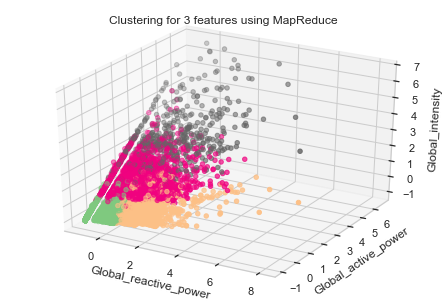

In [42]:
from mpl_toolkits.mplot3d import Axes3D
# Plotting 3D clustering graph for 3 features using matplotlib
fig = plt.figure()
ax = Axes3D(fig)
# Plotting scatter plot for 3 features
ax.scatter(df3['Global_reactive_power'], df3['Global_active_power'], df3['Global_intensity'], c=df3['MR_cluster'], 
           cmap='Accent')
# Setting title for the plot
ax.set_title("Clustering for 3 features using MapReduce")
# Setting x-axis label for the plot
ax.set_xlabel("Global_reactive_power")
# Setting y-axis label for the plot
ax.set_ylabel("Global_active_power")
# Setting z-axis label for the plot
ax.set_zlabel("Global_intensity")
# To display the plot
plt.show()

#### MR Visualizing 7:

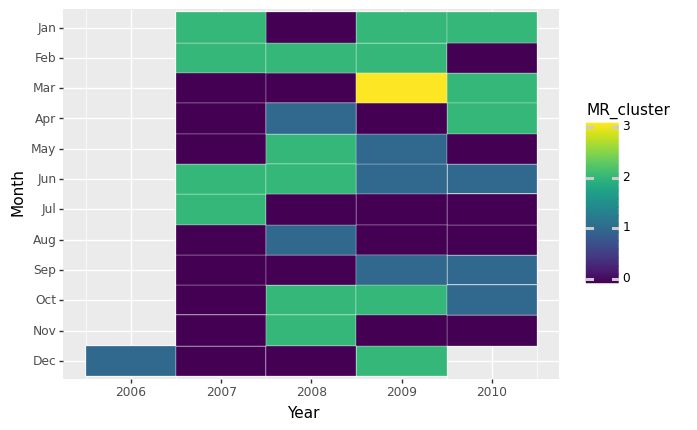

In [43]:
# Extracting Year from DateTime column
df3['Year'] = df3['DateTime'].dt.year
# Extracting Month from DateTime column
df3['Month'] = df3['DateTime'].dt.month
# Converting Month number to Month name
df3['Month'] = df3['Month'].apply(lambda x: calendar.month_abbr[x])
# Creating a list to pass in the plot as y-axis
m_list = ['Dec','Nov','Oct','Sep','Aug','Jul','Jun','May','Apr','Mar','Feb','Jan']
# Creating a calender map plot using ggplot
g = ggplot(df3, aes(x = 'Year', y = 'Month', fill = 'MR_cluster')) +\
    geom_tile(color = "white", size = 0.1) +\
    scale_y_discrete(limits=m_list)
print(g)

#### MR Visualization 8: Using PCA to plot in 2D plane

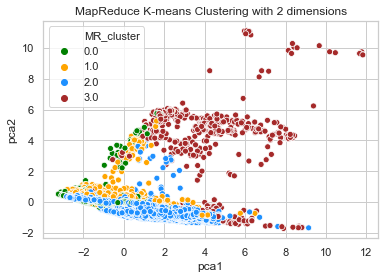

In [44]:
# Reducing the number of features using PCA in order plot the clusters in 2D plane.
df4 = df1.head(10000)
# Taking the required features to reduce the dimensionality
df5 = df4.loc[:,"Global_active_power":"Sub_metering_3"]
# Applying PCA, fitting and transforming the data
pca = PCA(n_components = 2).fit_transform(df5)
# Adding the PCA components in a dataframe
df_pca = pd.DataFrame(pca, columns = ['pca1','pca2'])
# Adding Cluster labels in the dataframe
df_pca['MR_cluster'] = df4['MR_cluster']
# Plotting a scatterplot to visualize the clusters
sns.scatterplot(x = "pca1", y = "pca2", hue = 'MR_cluster', palette=['green','orange','dodgerblue','brown'], data = df_pca, legend='full')
# Setting a title for the plot
plt.title('MapReduce K-means Clustering with 2 dimensions')
# To display the plot
plt.show()